# Machine Learning (and Deep Learning) in just over 200 minutes with R
Created by [Ajay Hemanth](https://www.linkedin.com/in/ajayhemanth/?originalSubdomain=au) with [Yoni Nazarathy](https://yoninazarathy.com/). 

See more material at the [workshop's GitHub page](https://github.com/ajayhemanth/Machine-Learning-Workshop).

--- 

# Activity A: Linear Classifiers
---

# Least Squares

$$
\min_\beta ||A\beta - y||^2
$$

Here $A$ is the design matrix. It is a $n \times (p+1)$ matrix where each column is a feature and each row is an observation.

$$
A = 
\left[
\begin{matrix}
1 & x_1^1 & x_2^1 & \cdots & x_p^1 \\
1 & x_1^2 & x_2^2 & \cdots & x_p^2\\
\vdots & \vdots & \vdots && \vdots\\
1 & x_1^n & x_2^n & \cdots & x_p^n\\
\end{matrix}
\right]
$$

In [1]:
# ordinary least squares is used to find linear coefficients with help of iris dataset.

# "Sepal.Length" and "Petal.Width" columns are used to predict "Petal.Length"
A = iris[ , c("Sepal.Length", "Petal.Width") ]

# 1s is used as column for the intercept coefficient
A[ , 'intercept'] = 1

In [2]:
Y = iris[ , "Petal.Length" ]

In [3]:
A = as.matrix(A)
Y = as.matrix(Y)

For statisticians, solving the least squares is usaully via

$$
\hat{\beta} = A^\dagger y
$$

where $A^\dagger$ is the pseudoinverse.

The pseudoinverse is $A^\dagger = (A^\top A) ^{-1} A^\top$ when $A$ is full rank, otherwsie it is also defined.

In [4]:
ols1 = ( solve( t(A) %*% A ) %*% t(A) ) %*% Y
ols1

# comparing it with lm function
lm(Petal.Length ~ Sepal.Length + Petal.Width, data=iris)

Sepal.Length,0.5422556
Petal.Width,1.7481029
intercept,-1.5071384



Call:
lm(formula = Petal.Length ~ Sepal.Length + Petal.Width, data = iris)

Coefficients:
 (Intercept)  Sepal.Length   Petal.Width  
     -1.5071        0.5423        1.7481  


## Gradient Descent

$$
\nabla(\beta) = 2 A^\top(A \beta - y).
$$

In [5]:
lr = 0.0001  # learning rate
b = runif(3) # random starting points for beta
bh = t(b) # bh stores value of betas for each iteration
for (i in 1:100000) {
    gradient = 2 * t(A) %*% ( (A %*% b) - Y ) # calculate gradient
    b = b - lr * gradient # update beta
    bh = rbind(bh, t(b)) # store beta to bh
    if(i%%100 == 0){
        cat(".")
        flush.console()
    }
}
b

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Sepal.Length,0.5422556
Petal.Width,1.7481029
intercept,-1.5071384


### Calculating Error for each combination of $\beta$ through gradient descent

Calculating $\sum (\hat{y}-y)^2 $ for each $\beta$ combination of gradient descent.

In [6]:
error = colSums((A %*% t(bh) - as.vector(Y))^2)

In [7]:
# plotting the coefficients (in the 3 axes) - with error as color

gradientData = data.frame(bh, error=error)

library('plotly')
fig <- plot_ly(gradientData, x = ~Sepal.Length, y = ~Petal.Width, z = ~intercept, type = 'scatter3d', mode = 'lines',
        opacity = 1, line = list(width = 6, color = ~error, reverscale = FALSE))
fig

Loading required package: ggplot2

Warning message:
"package 'ggplot2' was built under R version 4.0.5"

Attaching package: 'plotly'


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked from 'package:stats':

    filter


The following object is masked from 'package:graphics':

    layout




HTML widgets cannot be represented in plain text (need html)

## Now the discussion goes into MNIST
MNIST contain 28 X 28 pixels hand-written digits like the below.<br>
$28\times 28 = 784$ features 

<div>
<img src="img/MNIST.png" width="200" align="center"/>
</div>

In [1]:
library('keras')
library('MASS') # package to calculate pseudo inverse

#####  ** Participants who are facing issues with "Keras" please uncomment the next cell **

In [8]:
to_categorical = function(y) {
    A = matrix(nrow=length(y),ncol=max(y)+1)
    for(i in 0:max(y)) {
        A[,i+1] = (y==i)*1
    }
    return(A)
}


dataset_mnist = function() {
    return(readRDS(file="dataset/mnist.rds"))
}

array_reshape = function(x) {
    if(dim(x)[1]==60000) {
        return(readRDS(file="dataset/train.rds"))
    } else {
        return(readRDS(file="dataset/test.rds"))
    }
}

array_reshape = function(x,u) {
    if(dim(x)[1]==60000) {
        return(readRDS(file="dataset/train.rds"))
    } else {
        return(readRDS(file="dataset/test.rds"))
    }
}


In [9]:
mnist <- dataset_mnist() # loading data -- function present in keras package

mnist dataset contains a training set and a test set.<br>
"$x$" and "$y$" are explanatory and response variables in each set.

In [10]:
str(mnist)

List of 2
 $ train:List of 2
  ..$ x: int [1:60000, 1:28, 1:28] 0 0 0 0 0 0 0 0 0 0 ...
  ..$ y: int [1:60000(1d)] 5 0 4 1 9 2 1 3 1 4 ...
 $ test :List of 2
  ..$ x: int [1:10000, 1:28, 1:28] 0 0 0 0 0 0 0 0 0 0 ...
  ..$ y: int [1:10000(1d)] 7 2 1 0 4 1 4 9 5 9 ...


In [11]:
mnist$train$x[1,,]

0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,175,26,166,255,247,127,0,0,0,0
0,0,0,0,0,0,0,0,30,36,⋯,225,172,253,242,195,64,0,0,0,0
0,0,0,0,0,0,0,49,238,253,⋯,93,82,82,56,39,0,0,0,0,0
0,0,0,0,0,0,0,18,219,253,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,80,156,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,14,⋯,0,0,0,0,0,0,0,0,0,0


#### Plotting the 1st digit of MNIST

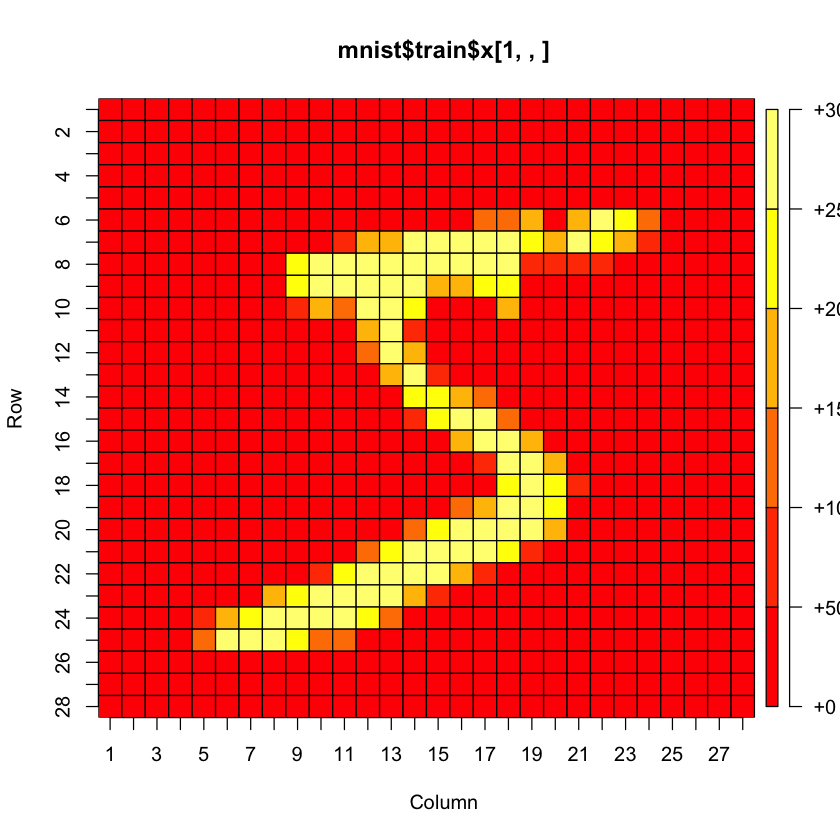

In [12]:
library("plot.matrix")
plot(mnist$train$x[1,,])

In [13]:
# flattening 28 X 28 pixels

A <- array_reshape( mnist$train$x, c(dim(mnist$train$x)[1], 784) )
dim(A)
head(A)

[1] 60000   784

0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [14]:
# adding 1s as a feature for the intercept term

A = cbind(matrix(rep(1, nrow(A))), A)
dim(A)
head(A)

[1] 60000   785

1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [15]:
 # The response variable is the digit number varying from 0 to 9.
 
table(mnist$train$y)


   0    1    2    3    4    5    6    7    8    9 
5923 6742 5958 6131 5842 5421 5918 6265 5851 5949 

In [16]:
# to_categorical function is used to create binary matrix from categorical data.
# However it requires the categorical data to be numbered starting from 0. else it will create '0' columns for number from 0 until the minimum value of categorical column.

to_categorical(0:2)
to_categorical(1:3)

1,0,0
0,1,0
0,0,1


0,1,0,0
0,0,1,0
0,0,0,1


In [17]:
# converting the response column to binary class matrix

Y = to_categorical(mnist$train$y) 
head(Y)

0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0
0,0,0,0,1,0,0,0,0,0
0,1,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,1
0,0,1,0,0,0,0,0,0,0


In [18]:
# optional - replacing 0 with -1

Y[Y==0] = -1
dim(Y)
head(Y)

[1] 60000    10

-1,-1,-1,-1,-1,1,-1,-1,-1,-1
1,-1,-1,-1,-1,-1,-1,-1,-1,-1
-1,-1,-1,-1,1,-1,-1,-1,-1,-1
-1,1,-1,-1,-1,-1,-1,-1,-1,-1
-1,-1,-1,-1,-1,-1,-1,-1,-1,1
-1,-1,1,-1,-1,-1,-1,-1,-1,-1


$$
\hat{\beta} = A^\dagger y
$$

where $A^\dagger$ is the pseudoinverse.

In [19]:
pseudoInv = ginv(A)

In [20]:
b = pseudoInv %*% Y
dim(b)

[1] 785  10

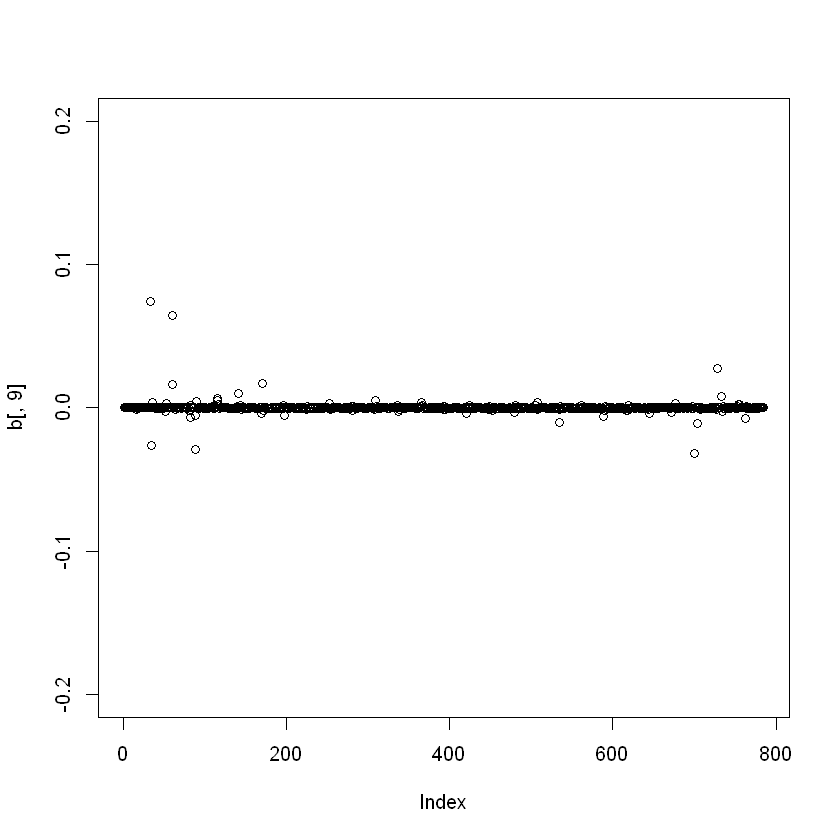

In [21]:
plot(b[,9], ylim=c(-.2,.2))

$$
\hat{y} = A \hat{\beta}
$$


In [22]:
pred = A %*% b
head(pred)

-0.8271185,-0.9904671,-1.1889471,-0.1365709,-1.4150917,0.02235069,-0.6314874,-0.3698790,-1.2594672,-1.2033218
0.7737636,-0.8768541,-1.1924732,-0.9855280,-1.1767060,-0.94931101,-0.9281304,-0.7787111,-1.0776747,-0.8083752
-1.1481889,-0.8131565,-0.6768824,-0.6580188,0.3703381,-1.10675416,-1.0286096,-0.5800073,-1.0459793,-1.3127411
-1.1166860,0.3722302,-0.8221547,-0.9141599,-0.8223580,-0.93355732,-0.9740822,-0.9429679,-0.6584615,-1.1878027
-0.8284813,-0.7965616,-1.0432375,-1.3244595,-0.6700891,-1.17978914,-1.0483052,-0.6528815,-0.8052589,0.3490638
-0.8067761,-0.9448907,0.2313171,-1.2461828,-1.0338279,-0.74205743,-1.2052950,-0.8687991,-0.9848685,-0.3986195


In [23]:
# "pred" is a number proportional to the possibility of an instance belonging to a digit. 
# we classify the instance into that class which is maximum 

table(mnist$train$y, apply(pred, 1, which.max)-1)   #  confusion matrix
mean(mnist$train$y == apply(pred, 1, which.max)-1)  #  train accuracy

   
       0    1    2    3    4    5    6    7    8    9
  0 5682    7   18   14   24   43   64    4   61    6
  1    2 6548   40   15   19   31   14   12   55    6
  2   99  264 4792  149  108   11  234   91  192   18
  3   42  167  176 5158   32  125   56  115  135  125
  4   10   99   42    6 5212   50   39   23   59  302
  5  164   95   28  432  105 3991  192   36  235  143
  6  108   74   61    1   70   90 5476    0   35    3
  7   55  189   37   47  170    9    2 5426   10  320
  8   75  493   63  226  105  221   56   20 4412  180
  9   68   60   20  117  371   12    4  492   38 4767

[1] 0.8577333

In [24]:
# redoing the same steps to calculate test error

A <- array_reshape( mnist$test$x, c(dim(mnist$test$x)[1], 784) )
A = cbind(matrix(rep(1, nrow(A))), A)
pred = A %*% b

table(mnist$test$y, apply(pred, 1, which.max)-1)
mean(mnist$test$y == apply(pred, 1, which.max)-1)

   
       0    1    2    3    4    5    6    7    8    9
  0  944    0    1    2    2    7   14    2    7    1
  1    0 1107    2    2    3    1    5    1   14    0
  2   18   54  813   26   15    0   42   22   37    5
  3    4   17   23  880    5   17    9   21   22   12
  4    0   22    6    1  881    5   10    2   11   44
  5   23   18    3   72   24  659   23   14   39   17
  6   18   10    9    0   22   17  875    0    7    0
  7    5   40   16    6   26    0    1  884    0   50
  8   14   46   11   30   27   40   15   12  759   20
  9   15   11    2   17   80    1    1   77    4  801

[1] 0.8603

#### Create a function which takes as argument an image, and returns the digit predicted using the trained $\beta$

In [25]:
myClassifier = function(img) {
    #     convert img to vector
    #     append intercept
    #     multiply by trained weights
    #     choose which max
    #     return predicted digit
}

In [26]:
myClassifier = function(img) {

    # convert img to vector
    A <- array_reshape( img, c(1, 784) )
    
    # append intercept
    A = cbind(matrix(rep(1, nrow(A))), A)

    # multiply by trained weights
    pred = A %*% b
    
    # choose which max
    predDigit = apply(pred, 1, which.max)-1
    
    return(predDigit)

}

In [27]:
# predicting a digit using the classifier udf

myClassifier(mnist$train$x[1,,])
mnist$train$y[1]

[1] 5

[1] 5

### MNIST Prediction using Gradient Descent 

In [28]:
A <- array_reshape( mnist$train$x, c(dim(mnist$train$x)[1], 784) )
A = cbind(matrix(rep(1, nrow(A))), A)

Y = to_categorical(mnist$train$y)
Y[Y==0] = -1 # optional


lr = 0.00001 
b = matrix(runif(ncol(A)*ncol(Y)), ncol=ncol(Y)) ;
for (i in 1:10) {
    gradient = 2 * t(A) %*% ( (A %*% b) - Y )
    b = b - lr * gradient
}


In [29]:
b

2.863102e+62,2.837752e+62,2.684957e+62,2.958175e+62,2.803195e+62,2.894047e+62,2.726449e+62,2.863516e+62,2.824402e+62,2.818816e+62
9.252864e-01,8.846263e-01,7.160053e-01,4.640389e-01,6.132394e-01,9.578930e-01,4.694949e-01,5.764122e-01,6.097954e-01,8.034644e-01
6.117768e-01,4.267213e-01,5.942531e-02,9.259357e-01,3.474831e-01,9.026527e-01,2.893416e-01,7.163795e-01,4.844175e-01,8.549172e-01
8.154182e-02,3.304924e-01,2.393601e-01,5.785547e-01,5.536962e-01,6.806644e-01,8.936631e-01,4.005085e-01,7.243140e-02,5.645751e-01
6.239061e-01,3.290988e-01,8.793752e-01,7.438755e-01,6.798973e-01,6.474702e-01,3.625287e-01,6.493642e-02,1.026268e-01,7.203282e-02
4.853511e-01,7.633735e-01,9.849940e-01,9.152369e-01,9.515466e-01,2.620689e-01,4.120392e-01,9.934565e-02,8.802339e-01,2.917178e-01
5.150294e-01,7.367327e-01,3.799405e-01,7.209038e-01,6.970594e-01,9.830365e-01,9.112399e-01,8.300604e-02,9.761849e-01,7.767918e-01
8.702183e-01,3.437280e-02,4.213502e-01,2.893267e-01,8.644164e-01,1.989653e-01,1.077223e-01,2.301508e-01,9.815122e-01,4.820125e-01
4.777385e-01,7.852600e-01,6.866063e-01,4.438994e-01,9.646685e-01,1.834719e-01,6.469725e-01,7.967787e-01,3.578461e-01,2.703527e-01
2.966459e-01,8.093433e-01,6.406690e-01,9.323917e-01,1.931720e-01,9.671010e-01,1.228236e-02,2.571608e-01,7.573232e-01,4.586511e-01
2.928828e-01,2.874491e-01,5.690286e-01,5.357312e-01,6.925747e-02,2.508810e-01,9.456297e-01,1.384767e-01,2.383114e-02,3.165274e-01
